In [1]:
# https://tech.fusic.co.jp/posts/2020-01-20-remove-background/
!pip install opencv-python
!pip install matplotlib
!pip install torch
!pip install torchvision

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision import transforms

import os
import matplotlib.pyplot as plt

In [3]:
import glob

files = glob.glob(os.getcwd() + '/img/*')
for file in files:
    print(file)

/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/8.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/9.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/10.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/4.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/5.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/7.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/6.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/2.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/3.jpg
/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/1.jpg


In [4]:
def create_mask_with_semantic_segmentation(image_path, output_path): 
    img = cv2.imread(image_path)
    #plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    #plt.show()
    
    img = img[...,::-1] 
    h,w,_ = img.shape
    img = cv2.resize(img,(320,320))
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True)
    model = model.to(device)
    model.eval();
    
    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_tensor = preprocess(img)
    input_batch = input_tensor.unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = model(input_batch)['out'][0]
    output = output.argmax(0)
    mask = output.byte().cpu().numpy()
    mask = cv2.resize(mask,(w,h))
    img = cv2.resize(img,(w,h))
    plt.gray()
    plt.figure(figsize=(20,20))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.subplot(1,2,2)
    plt.imshow(mask);
    plt.show()
    
    cv2.imwrite(output_path, mask)
    
    return img, mask

In [5]:
def get_filepath(dir_name, suffix):
    base_path = os.getcwd() + "/" + dir_name + "/"
    if not os.path.exists(base_path):
        os.mkdir(base_path)
    return base_path + file.split("/")[-1].split(".")[0] + "_" + suffix + "." + file.split(".")[1] 

<Figure size 432x288 with 0 Axes>

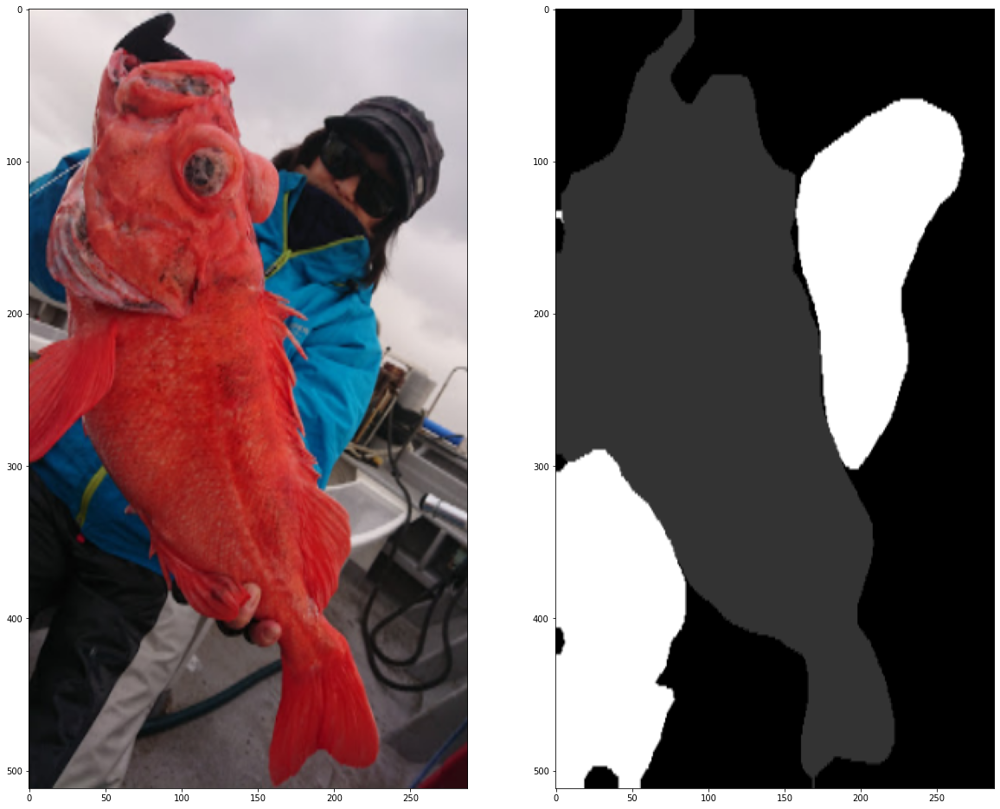

<Figure size 432x288 with 0 Axes>

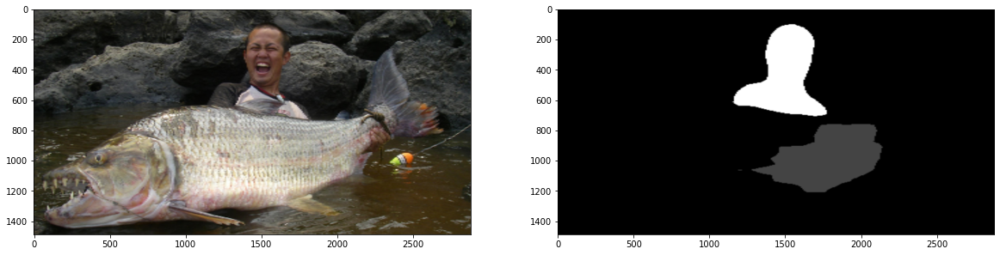

<Figure size 432x288 with 0 Axes>

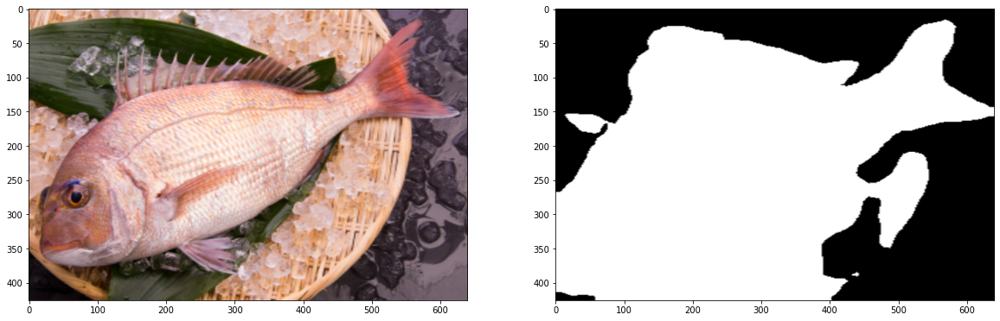

<Figure size 432x288 with 0 Axes>

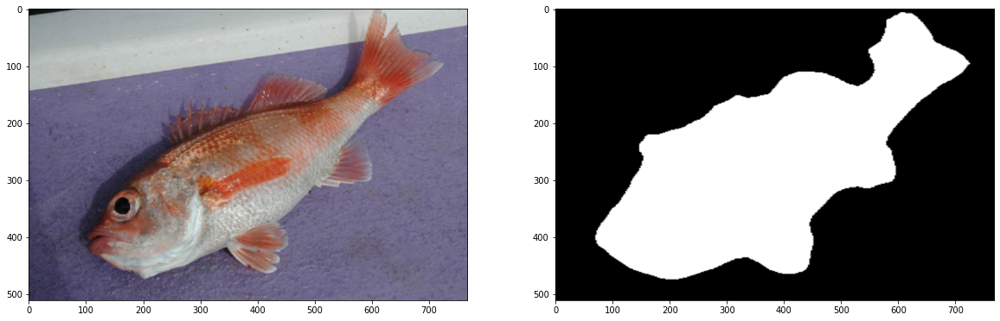

<Figure size 432x288 with 0 Axes>

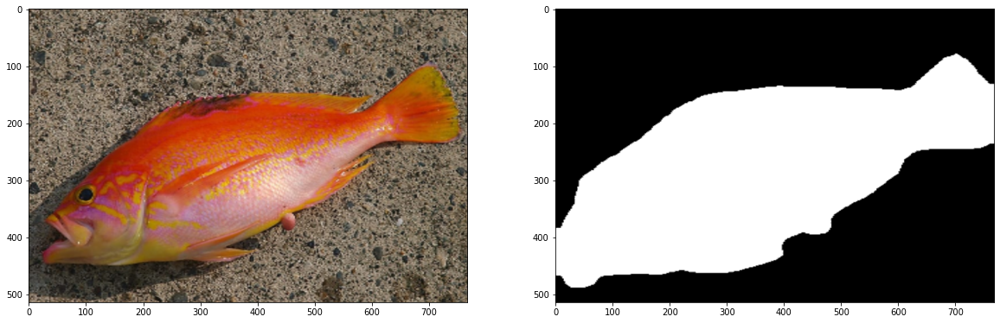

<Figure size 432x288 with 0 Axes>

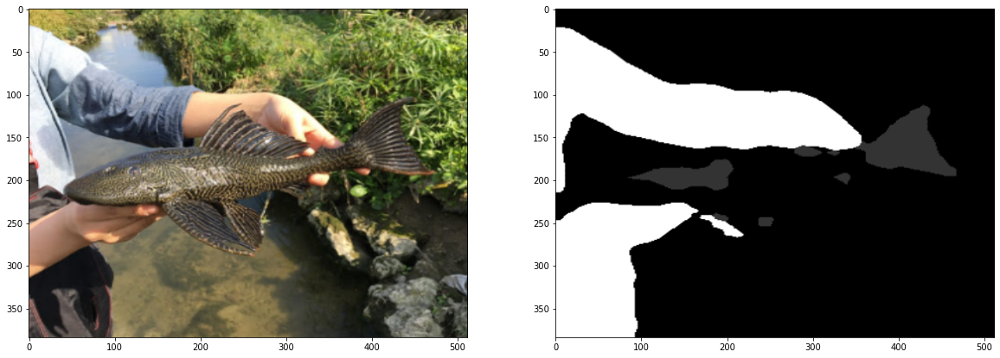

<Figure size 432x288 with 0 Axes>

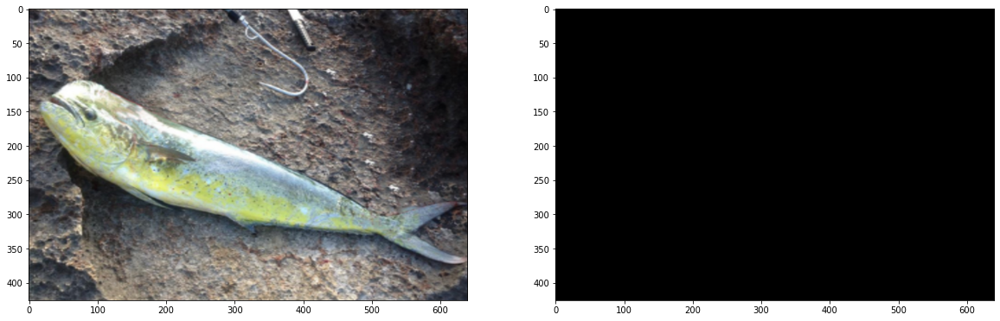

<Figure size 432x288 with 0 Axes>

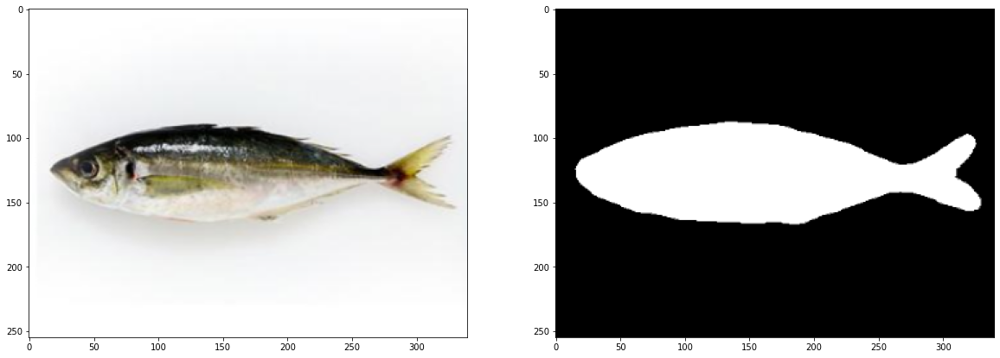

<Figure size 432x288 with 0 Axes>

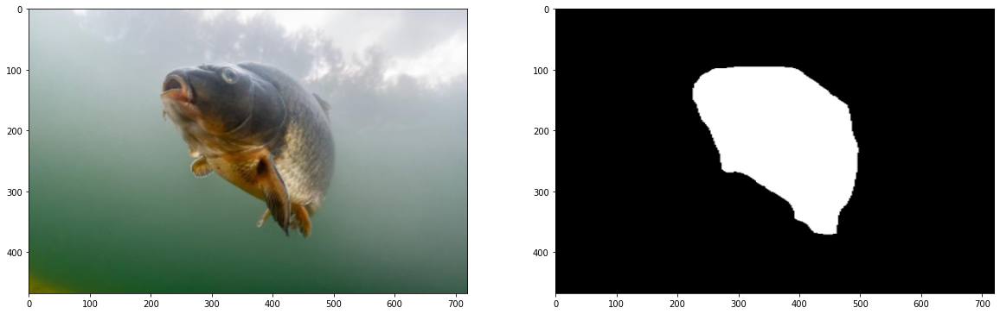

<Figure size 432x288 with 0 Axes>

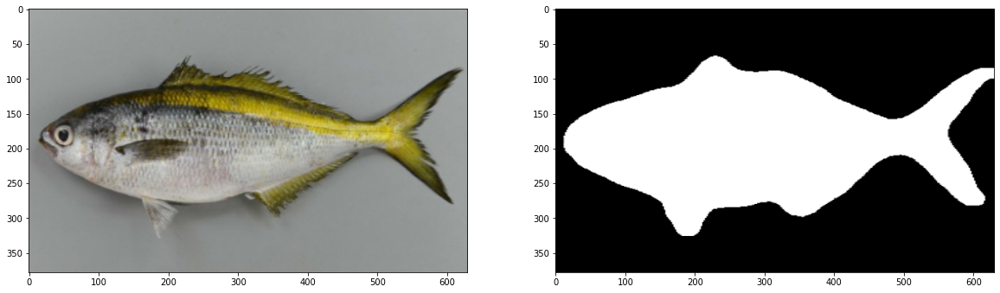

In [6]:
img_list = []
mask_list = []
for file in files:
    img, mask = create_mask_with_semantic_segmentation(file, get_filepath("mask_img", "mask") )
    img_list.append(img)
    mask_list.append(mask)

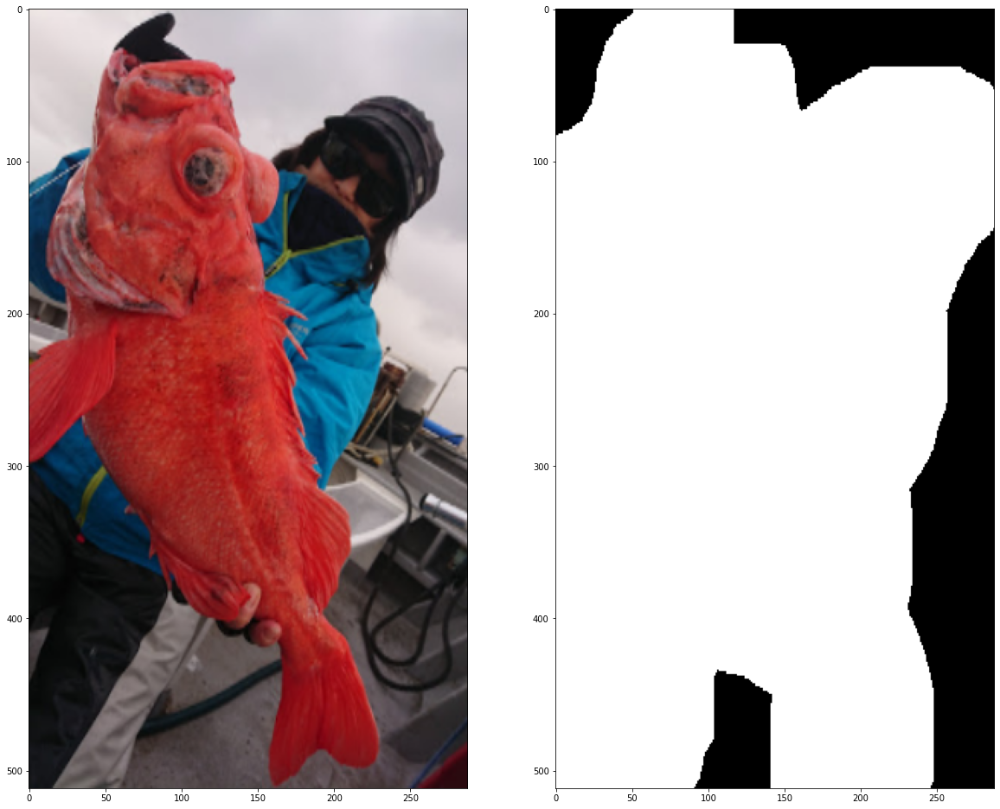

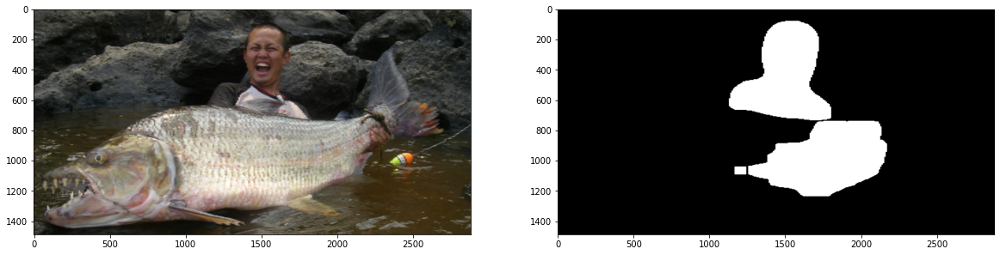

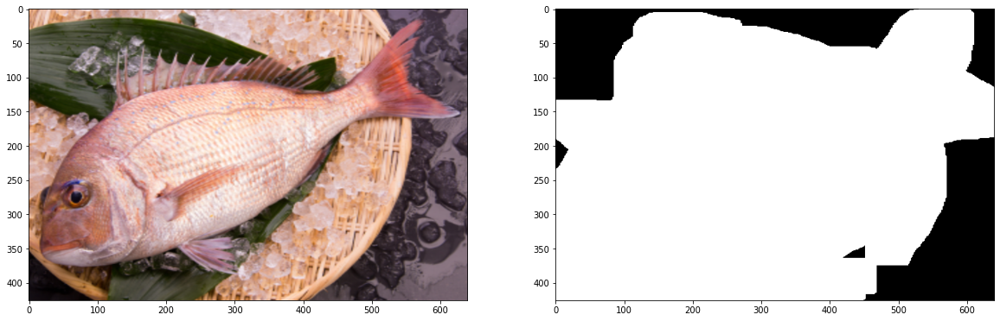

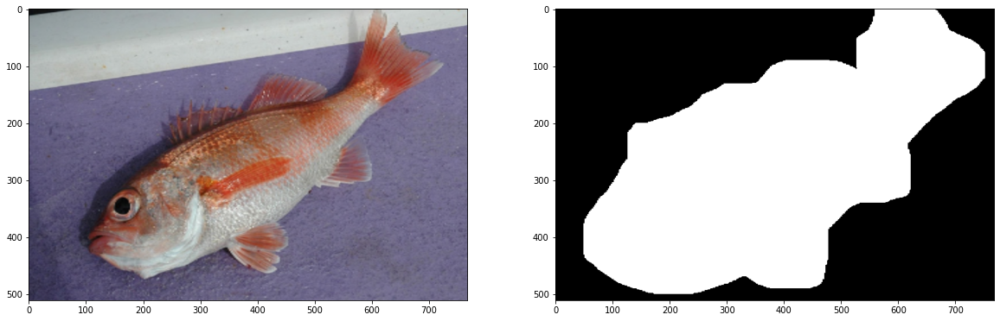

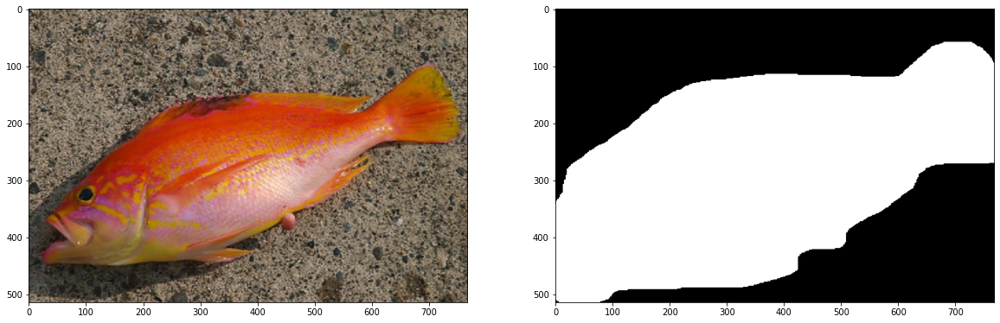

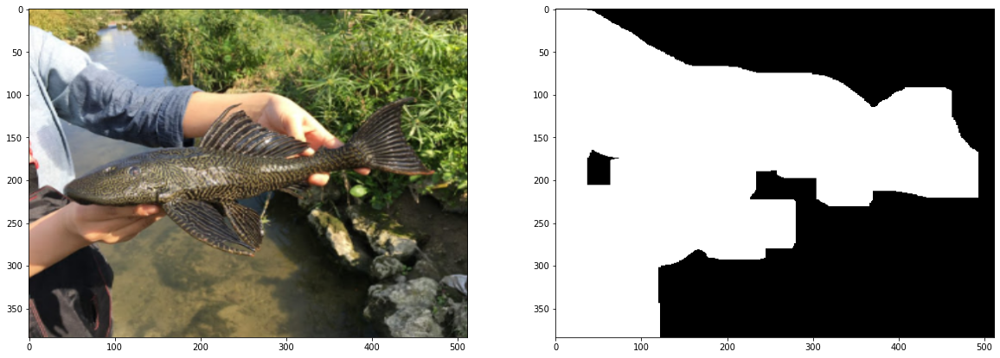

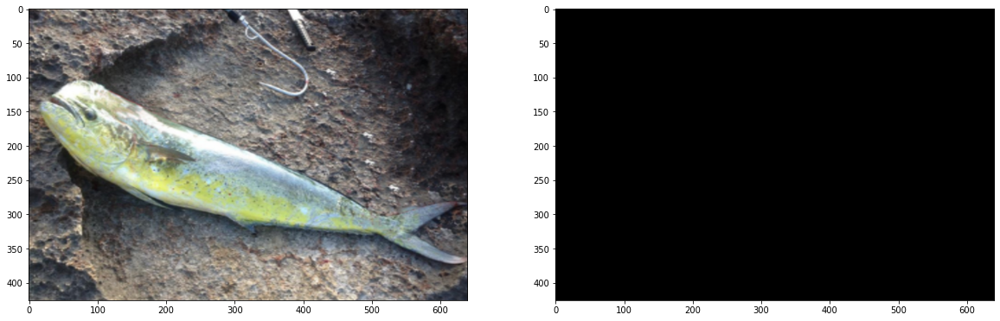

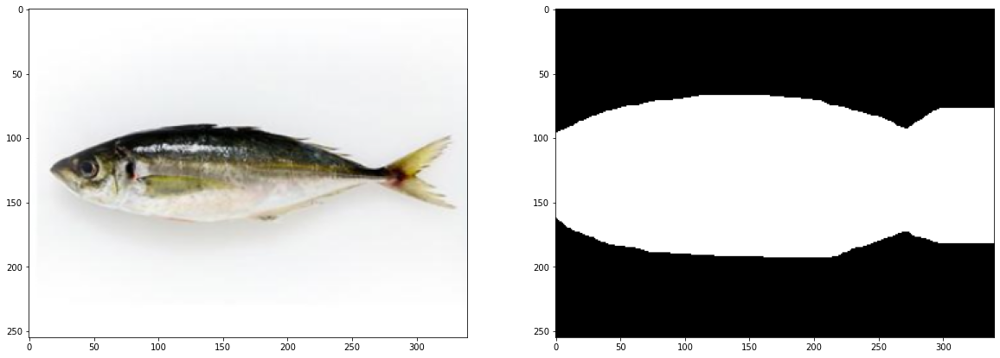

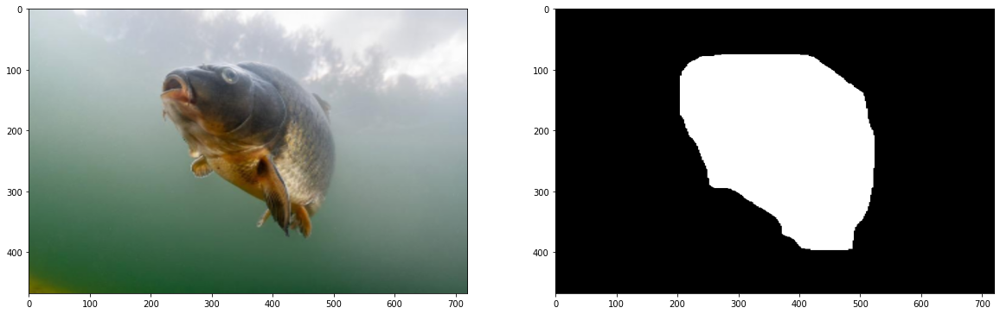

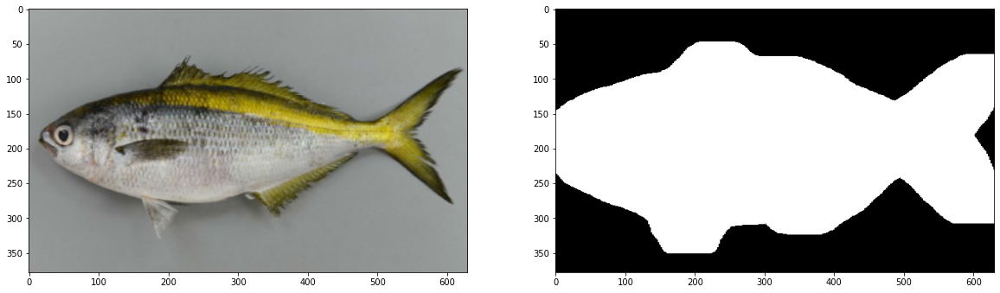

In [7]:
def generate_trimap(mask, k_size=(5,5), ite=1):
    kernel = np.ones(k_size, np.uint8)
    eroded = cv2.erode(mask, kernel, iterations = ite)
    dilated = cv2.dilate(mask, kernel, iterations = ite)
    trimap = np.full(mask.shape, 128)
    trimap[eroded == 255] = 255
    trimap[dilated == 0] = 0
    return trimap

for img, mask in zip(img_list, mask_list):
    trimap = generate_trimap(mask, k_size=(10, 10), ite=5)
    cv2.imwrite(get_filepath("trimap_img", "trimap"), trimap)
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.imshow(trimap)

In [8]:
# IndexNet Matting
#!git clone https://github.com/poppinace/indexnet_matting

In [9]:
def apply_mask_to_img(img, mask):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    for x in range(len(mask)):
        for y in range(len(mask[0])):
            if mask[x, y] == 0:
                img[x, y, 0] = 255
                img[x, y, 1] = 255
                img[x, y, 2] = 255
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    cv2.imwrite(get_filepath("result_img", "result"), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

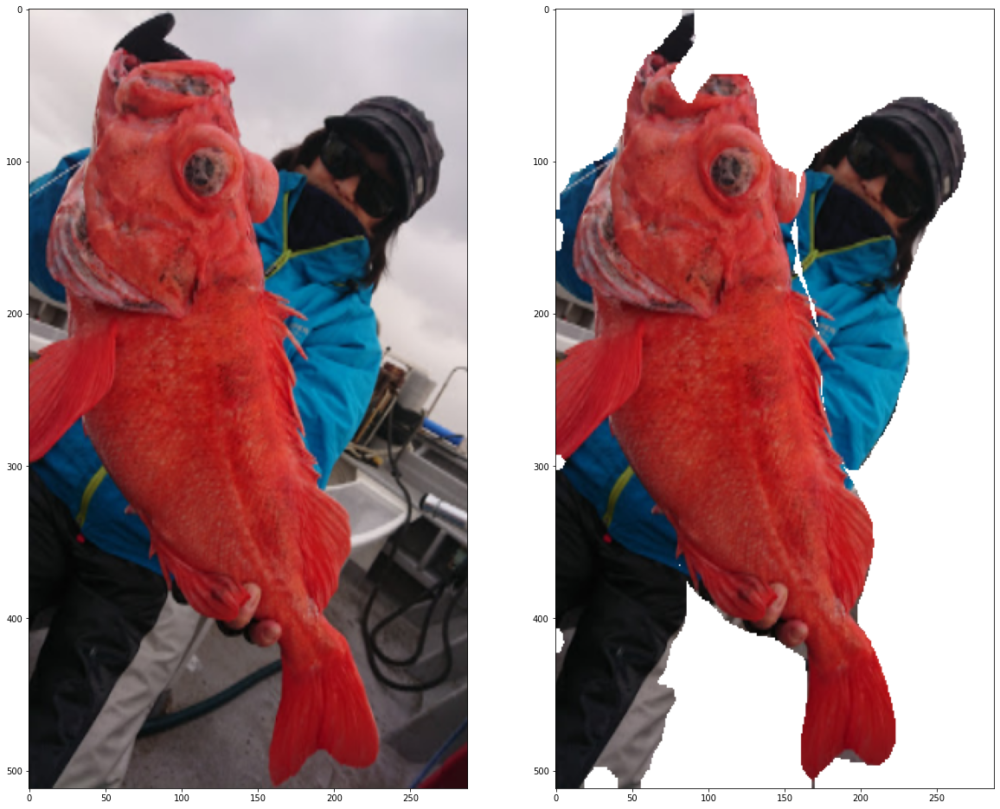

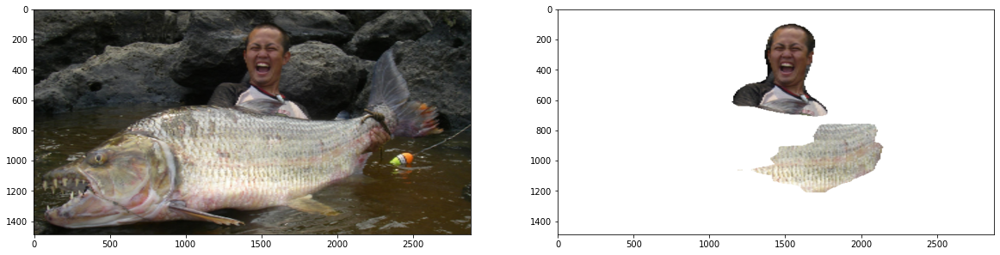

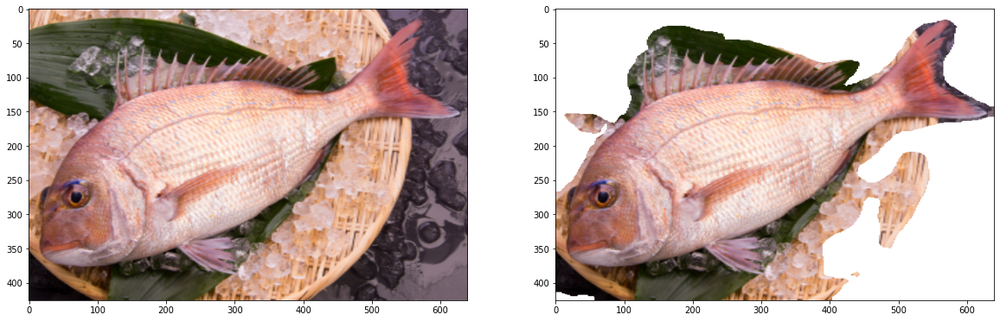

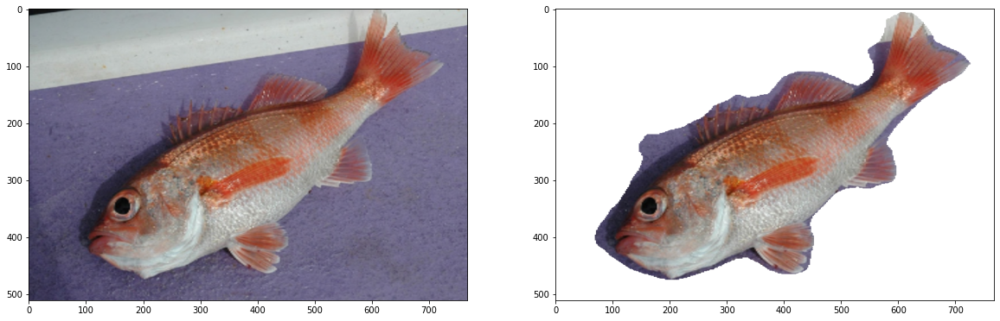

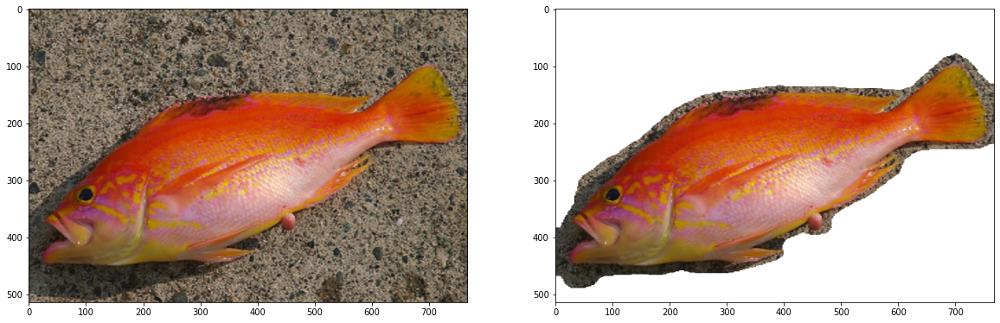

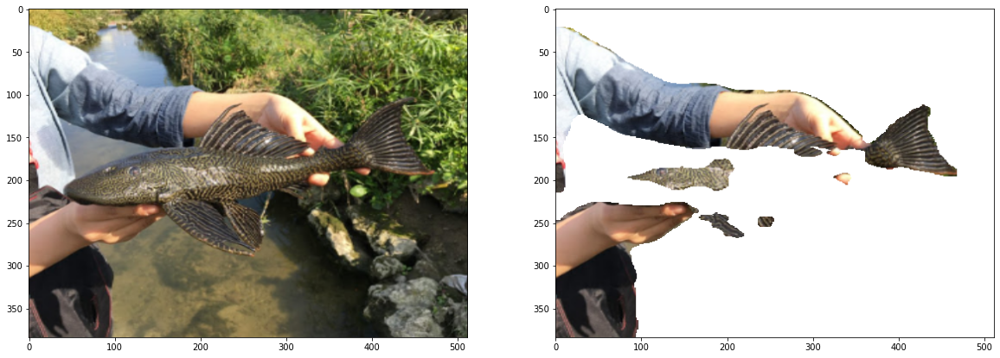

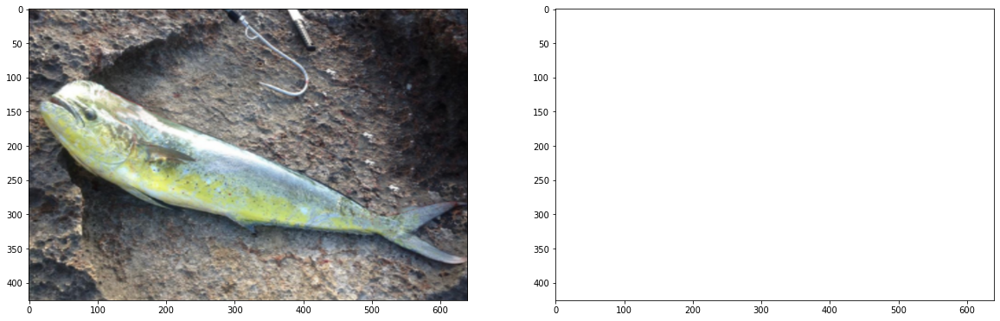

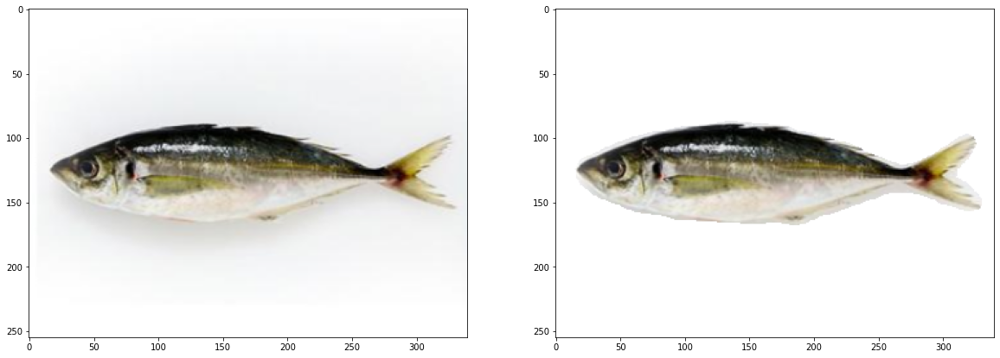

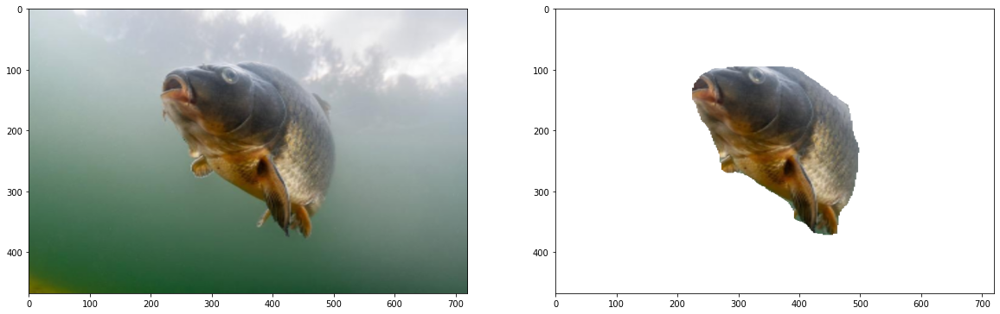

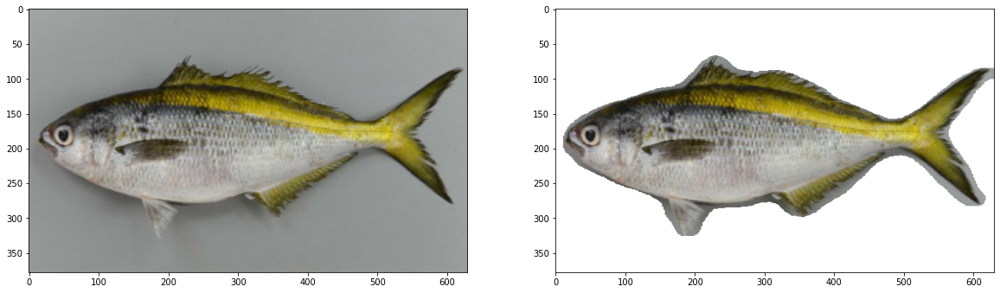

In [10]:
for img, mask in zip(img_list, mask_list):
    apply_mask_to_img(img, mask)

<Figure size 432x288 with 0 Axes>

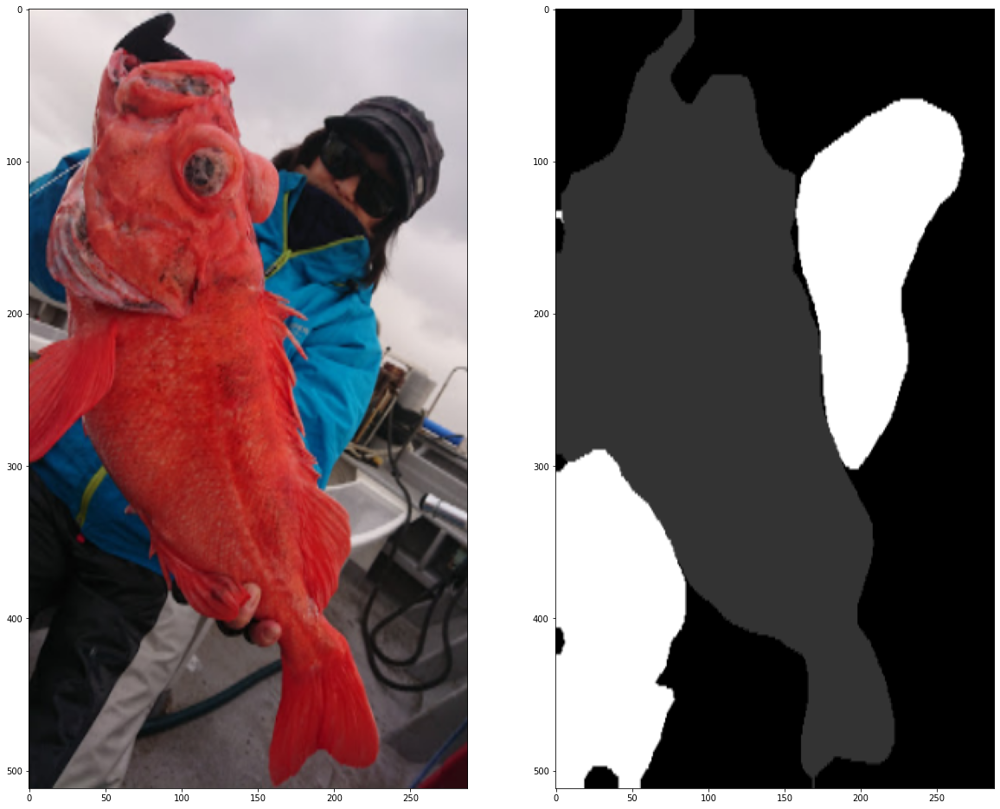

In [11]:
img, mask = create_mask_with_semantic_segmentation(files[0], get_filepath("mask_img", "mask") )

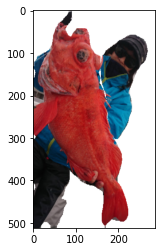

In [12]:
plt.imshow(img[:, :, 0] * mask)

mylist = [(x, y) for x in range(len(mask)) for y in range(len(mask[0]))]

for x, y in mylist:
    if (mask[x, y] == 0):
        img[x, y, 0] = 255
        img[x, y, 1] = 255
        img[x, y, 2] = 255

plt.imshow(img)

In [13]:
[mask[x, y] == 0 for x, y in mylist]

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True

In [14]:
    for x in range(len(mask)):
        for y in range(len(mask[0])):
            if mask[x, y] == 0:
                img[x, y, 0] = 255
                img[x, y, 1] = 255
                img[x, y, 2] = 255


In [15]:
def remove_bg(
    path,
    BLUR = 21,
    CANNY_THRESH_1 = 10,
    CANNY_THRESH_2 = 200,
    MASK_DILATE_ITER = 10,
    MASK_ERODE_ITER = 10,
    MASK_COLOR = (0.0,0.0,1.0),
):
    img = cv2.imread(path)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    edges = cv2.Canny(gray, CANNY_THRESH_1, CANNY_THRESH_2)
    edges = cv2.dilate(edges, None)
    edges = cv2.erode(edges, None)

    contour_info = []
    contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    for c in contours:
        contour_info.append((
            c,
            cv2.isContourConvex(c),
            cv2.contourArea(c),
        ))
    contour_info = sorted(contour_info, key=lambda c: c[2], reverse=True)
    max_contour = contour_info[0]

    mask = np.zeros(edges.shape)
    cv2.fillConvexPoly(mask, max_contour[0], (255))

    mask = cv2.dilate(mask, None, iterations=MASK_DILATE_ITER)
    mask = cv2.erode(mask, None, iterations=MASK_ERODE_ITER)
    mask = cv2.GaussianBlur(mask, (BLUR, BLUR), 0)
    mask_stack = np.dstack([mask]*3)    # Create 3-channel alpha mask

    mask_stack  = mask_stack.astype('float32') / 255.0          # Use float matrices, 
    img         = img.astype('float32') / 255.0                 #  for easy blending

    masked = (mask_stack * img) + ((1-mask_stack) * MASK_COLOR) # Blend
    masked = (masked * 255).astype('uint8')                     # Convert back to 8-bit 

    c_blue, c_green, c_red = cv2.split(img)

    img_a = cv2.merge((c_red, c_green, c_blue, mask.astype('float32') / 255.0))

    plt.imshow(img_a)
    plt.show()
    return img_a

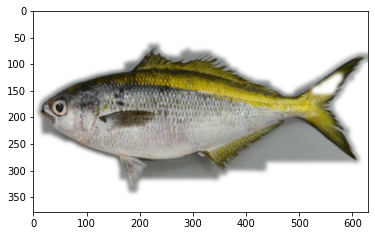

In [16]:
img_fin = remove_bg(    
    path = '/Users/motacapla/AndroidStudioProjects/tutter/api_server/flask/fish_detector/img/1.jpg',
    BLUR = 21,
    CANNY_THRESH_1 = 5,
    CANNY_THRESH_2 = 70,
    MASK_DILATE_ITER = 10,
    MASK_ERODE_ITER = 6,
)

In [17]:
print(img.shape)
print(img_fin.shape)

(512, 288, 3)
(378, 630, 4)


In [18]:
cv2.createBackgroundSubtractorMOG2()

while(1):
    ret, frame = cap.read()

    fgmask = fgbg.apply(frame)

    cv2.imshow('frame',fgmask)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

cap.release()
cv2.destroyAllWindows()

<BackgroundSubtractorMOG2 0x1368a1b10>